In [5]:
import os
import sys
import re
import time
import yaml
import shutil
import argparse
import tarfile
import tempfile
import random
import subprocess
import copy

import numpy as np
import pandas as pd

from tqdm import tqdm

import torch

import boda
from boda.generator.parameters import BasicParameters
from boda.common import utils
from boda.common.utils import set_best, save_model, unpack_artifact, model_fn

import hypertune

import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.graphics.tsaplots import plot_acf

from scipy import spatial
from scipy.cluster import hierarchy

In [6]:
test_path = 'gs://syrgoth/boda_library_design_202112/pickles/sg__hepg2__hmc__track_001__round_0__20211210_221758__613002.pt'
model_paths = [
    'gs://syrgoth/aip_ui_test/model_artifacts__20211113_021200__287348.tar.gz',
    'gs://syrgoth/aip_ui_test/model_artifacts__20211112_154705__841131.tar.gz',
    'gs://syrgoth/aip_ui_test/model_artifacts__20211113_205602__613479.tar.gz'
]

model_paths = ['gs://syrgoth/aip_ui_test/model_artifacts__20211113_021200__287348.tar.gz',
               'gs://syrgoth/aip_ui_test/model_artifacts__20211110_194934__672830.tar.gz',
               'gs://syrgoth/aip_ui_test/model_artifacts__20211119_011437__338420.tar.gz']

In [7]:
def load_models(*model_paths):
    models = []
    if len(model_paths) > 0:
        print(f'loading {len(model_paths)} model(s)')
        for i, model_path in enumerate(model_paths):
            with tempfile.TemporaryDirectory() as tmpdirname:
                unpack_artifact(model_path, tmpdirname)
                _hold = model_fn(os.path.join(tmpdirname,'artifacts'))
                _hold.cuda()
                _hold.eval()
                models.append( _hold )
    elif len(model_paths) > 0:
        print(f'assuming pre-loaded model(s)')
        models = model_paths
        
    return models

In [8]:
model_set = load_models(*model_paths)

loading 3 model(s)


archive unpacked in /tmp/tmp05ib9f6c


Loaded model from 20211113_021200 in eval mode


archive unpacked in /tmp/tmpme69p4of


Loaded model from 20211110_194934 in eval mode
Loaded model from 20211119_011437 in eval mode


archive unpacked in /tmp/tmpp_l_i1p9


In [9]:
def list_2_tensor(seq_list):
    return torch.stack(
        [utils.dna2tensor(subsequence) for subsequence in tqdm(seq_list)]
    )

l2t = list_2_tensor

In [10]:
def load_stash(filepath):
    if 'gs://' == filepath[:5]:
        with tempfile.TemporaryDirectory() as tmpdir:
            temp_loc = os.path.join( tmpdir, os.path.basename(filepath) )
            subprocess.check_call(
                ['gsutil', 'cp', filepath, temp_loc]
            )
            stash = torch.load(temp_loc)
    else:
        stash = torch.load(filepath)
    return stash

In [11]:
left_flank = boda.common.utils.dna2tensor( 
    boda.common.constants.MPRA_UPSTREAM[-200:] 
).unsqueeze(0)

right_flank= boda.common.utils.dna2tensor( 
    boda.common.constants.MPRA_DOWNSTREAM[:200] 
).unsqueeze(0)


def run_model(model, x):
    with torch.no_grad():
        bsz = x.shape[0]
        expander = [bsz, -1, -1]
        passthrough = BasicParameters(
            torch.randn_like(x), 
            left_flank = left_flank.expand(*expander), 
            right_flank = right_flank.expand(*expander)
        )
        passthrough.to(model.device)

        return model( passthrough(x.to(model.device)) ).cpu()

def load_stash_to_df(filepath, *model_paths, round_override=False):
    models = []
    if (len(model_paths) > 0) and isinstance(model_paths[0], str):
        models = load_models(*model_paths)
    elif len(model_paths) > 0:
        print(f'assuming pre-loaded model(s)')
        models = model_paths
    
    user, cell, gen, track_id, round_id, date_time, rand_id = os.path.basename(filepath).split('__')
    track_id = int(track_id.split('_')[1])
    date, time = [int(x) for x in date_time.split('_')]
    round_id = int(round_id.split('_')[1])
    rand_id = int(rand_id.split('.')[0])
    
    stash = load_stash(filepath)
    
    seq_list = []
    round_list = []
    
    model_results = { i: [] for i in range(len(models)) }
    
    for idx, proposal_round in enumerate(stash['proposals']):
        tensors = proposal_round['proposals']
        
        for j, model in enumerate(models):
            model_results[j].append( run_model(model, tensors) )
        
        seqs = list( utils.batch2list(tensors) )
        
        seq_list += seqs
        if round_override:
            round_list += [round_id] * len(seqs)
        else:
            round_list += [idx] * len(seqs)
        
    line_count = len(seq_list)
    
    data_dict =  {
        'sequence': seq_list,
        'penalty_round': round_list,
        'user': [ user ] * line_count,
        'generator':[ gen ] * line_count,
        'cell':[ cell ] * line_count,
        'track':[ track_id ] * line_count,
        'date':[ date ] * line_count,
        'time':[ time ] * line_count,
        'random_tag':[ rand_id ] * line_count,
    }

    relist_preds = []
    for i in range(len(models)):
        pred_set = model_results[i]
        cat_preds= torch.cat(pred_set, dim=0)
        n_preds, n_feats = cat_preds.shape
        relist_preds.append(cat_preds)
    avg_pred = torch.stack(relist_preds, dim=0).mean(0)
    for j in range(n_feats):
        data_dict[f'preds_cell_{j}'] = avg_pred[:,j].numpy()
    
    data = pd.DataFrame( data_dict )
    data['internal_index'] = np.arange(data.shape[0])
    
    return data

In [12]:
def read_fasta(file_obj):
    fasta_tags = []
    fasta_seqs = []
    
    for i, line in enumerate(file_obj.readlines()):
        if i % 2 == 0:
            fasta_tags.append(line.rstrip())
        else:
            fasta_seqs.append(line.rstrip().upper())
            
    return fasta_tags, fasta_seqs
    

def load_fasta(filepath):
    
    if 'gs://' == filepath[:5]:
        with tempfile.TemporaryDirectory() as tmpdir:
            temp_loc = os.path.join( tmpdir, os.path.basename(filepath) )
            subprocess.check_call(
                ['gsutil', 'cp', filepath, temp_loc]
            )
            with open(temp_loc, 'r') as f:
                stash = read_fasta(f)
    else:
        with open(filepath, 'w') as f:
            stash = read_fasta(f)
    return stash

def fasta_to_dataframes(filepath, *model_paths, cell_idx, generator='dhs', user='sr', date=20211207, time=122030, random_tag=999999):
    models = []
    if (len(model_paths) > 0) and isinstance(model_paths[0], str):
        models = load_models(*model_paths)
    elif len(model_paths) > 0:
        print(f'assuming pre-loaded model(s)')
        models = model_paths
    
    model_results = { i: [] for i in range(len(models)) }

    fasta_tags, fasta_seqs = load_fasta(filepath)
    line_count = len(fasta_seqs)

    data_dict =  {
        'sequence': fasta_seqs,
        'penalty_round': [0] * line_count,
        'user': [ user ] * line_count,
        'generator':[ generator ] * line_count,
        'cell':[ cell_idx ] * line_count,
        'track':[ 0 ] * line_count,
        'date':[ date ] * line_count,
        'time':[ time ] * line_count,
        'random_tag':[ random_tag ] * line_count,
        'carat_tag': fasta_tags,
    }
    
    onehot_sequences = torch.stack(
        [utils.dna2tensor(subsequence) for subsequence in tqdm(fasta_seqs)]
    )
    
    for j, model in enumerate(models):
        model_results[j].append( run_model(model, onehot_sequences) )
     
    relist_preds = []
    for i in range(len(models)):
        pred_set = model_results[i]
        cat_preds= torch.cat(pred_set, dim=0)
        n_preds, n_feats = cat_preds.shape
        relist_preds.append(cat_preds)
    avg_pred = torch.stack(relist_preds, dim=0).mean(0)
    for j in range(n_feats):
        data_dict[f'preds_cell_{j}'] = avg_pred[:,j].numpy()    
    
    data = pd.DataFrame( data_dict )
    data['internal_index'] = np.arange(data.shape[0])
    
    return data

In [13]:
def check_asiSI(sequence):
    asiSI = 'GCGATCGC'
    if asiSI[1:] == sequence[:7].upper():
        return True
    elif asiSI[:-1] == sequence[-7:].upper():
        return True
    elif asiSI in sequence.upper():
        return True
    else:
        return False


In [14]:
def selection_assignment(data, slicer, n_selected):
    slicer_copy = copy.deepcopy(slicer)
    
    slicer_as_indices = slicer.values.nonzero()[0]
    n_sliced = slicer_as_indices.shape[0]
    passed_idx = np.random.choice( slicer_as_indices, size=min(n_sliced,n_selected), replace=False )
    
    slicer_copy[:] = False
    slicer_copy[passed_idx] = True
    
    print(f'subsetting {slicer.sum()} items', file=sys.stderr)
    data.loc[slicer, 'selected'] = False
    
    print(f'down to {slicer_copy.sum()} items', file=sys.stderr)
    data.loc[slicer_copy, 'selected'] = True
    
    return data.loc[slicer_copy]

def make_selections(data, gen_list, cell_list, pen_list, n_items):
    for gen in gen_list:
        for cell in cell_list:
            for pen in pen_list:
                print(f'collecting {cell} specific sequences made with {gen}, and {pen} penalties', file=sys.stderr)
                slicer = (data['penalty_round'] == pen) & \
                         (data['cell'] == cell) & \
                         (data['generator']==gen)
                
                selection_assignment(data, slicer, n_items)
                
    print(f'\ttagged {data["selected"].sum()} sequences for synthesis so far', file=sys.stderr)
    
def dump_pandas_to_fasta(data, fasta_path):

    hold_path = fasta_path.split('.')
    hold_path[-1] = 'pkl'
    hold_path = '.'.join(hold_path)
    
    data.to_pickle(hold_path)
    
    with tempfile.TemporaryDirectory() as tempdir:
        temp_loc = os.path.join(tempdir, 'dump.txt')
        with open(temp_loc, 'w') as f:
        
            for idx, row in tqdm( data[ data['selected'] == True ].iterrows() ):

                date = row['date']
                time = row['time']
                random_tag = row['random_tag']
                internal_index = row['internal_index']

                gen = row['generator']
                cell= row['cell']
                pen = row['penalty_round']

                if (row['carat_tag'] is not np.nan) and (row['carat_tag'][0] == '>'):
                    carrot_line = row['carat_tag']
                else:
                    carrot_line = f'>{date}_{time}__{random_tag}__{internal_index}::{gen}__{cell}__{pen}'
                seq_line    = row['sequence']

                print(carrot_line, file=f)
                print(seq_line, file=f)
                
        if 'gs://' == fasta_path[:5]:
            subprocess.check_call(
                ['gsutil', 'cp', temp_loc, fasta_path]
            )
        else:
            shutil.copyfile(temp_loc, fasta_path)

In [15]:
my_data = load_stash_to_df(test_path, *model_set)

assuming pre-loaded model(s)


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:652: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool1d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [16]:
my_data

,sequence,penalty_round,user,generator,cell,track,date,time,random_tag,preds_cell_0,preds_cell_1,preds_cell_2,internal_index
0,ATTAATATTTAACTAGGGTGCCCTTGATATATGAGACCGGAGAATA...,0,sg,hmc,hepg2,1,20211210,221758,613002,-0.219546,2.707841,0.077014,0
1,AGAGTGCTGAGGCTATAATCATATCCCGTATTTCATCACTTTAGAG...,0,sg,hmc,hepg2,1,20211210,221758,613002,1.292572,5.143827,1.018110,1
2,GTTAATATTTAACTAGGGTGCCCTTGATATATGAGACCGGAGAATA...,0,sg,hmc,hepg2,1,20211210,221758,613002,0.435224,5.652621,1.794107,2
3,AGAGTGCTGACGCTATAATCATATCCCGTATTTCATCACTTTAGAG...,0,sg,hmc,hepg2,1,20211210,221758,613002,1.121369,4.774364,0.715658,3
4,GTTAATATTTACCTAGGGTGTCCTTGGTATATGAGTCCGGAGAATA...,0,sg,hmc,hepg2,1,20211210,221758,613002,0.115412,3.110324,0.013191,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,TGGAGTCTGTGGCCCAATTGATCCACCCCACTTGTCCCCGCACTAG...,0,sg,hmc,hepg2,1,20211210,221758,613002,0.000800,1.653377,-0.126287,495
496,TCAGTCATAGATCGATCGAAAAAAAATTTAACCTCTAAAGCTTTCT...,0,sg,hmc,hepg2,1,20211210,221758,613002,0.459249,2.438561,0.369561,496
497,TCCTTCATAGACCGATCCCAAAAAAATTAAACCTCTAAAGCTTTCT...,0,sg,hmc,hepg2,1,20211210,221758,613002,0.282571,2.270793,-0.058715,497
498,TTCTTCATAGCCCGATCCAAAAAAAATTAAACCTCTAAAGCTTTCT...,0,sg,hmc,hepg2,1,20211210,221758,613002,0.017797,1.713702,-0.102385,498


In [17]:
gs_paths = !gsutil ls $'gs://syrgoth/boda_library_design_202112/pickles'
sg_pickle_paths = [ path for path in gs_paths if ('sg__' in path) and ('fsp__' not in path) ]
gs_paths = !gsutil ls $'gs://syrgoth/boda_library_design_202112/extra_pickles_3'
sg_pickle_paths +=[ path for path in gs_paths if ('sg__' in path) ]

sg_data = pd.concat([ load_stash_to_df(path, *model_set) for path in tqdm(sg_pickle_paths) ]).reset_index(drop=True)

  0%|          | 0/87 [00:00<?, ?it/s]

assuming pre-loaded model(s)


  1%|          | 1/87 [00:01<02:33,  1.79s/it]

assuming pre-loaded model(s)


  2%|▏         | 2/87 [00:03<02:28,  1.74s/it]

assuming pre-loaded model(s)


  3%|▎         | 3/87 [00:04<02:07,  1.52s/it]

assuming pre-loaded model(s)


  5%|▍         | 4/87 [00:06<01:59,  1.44s/it]

assuming pre-loaded model(s)


  6%|▌         | 5/87 [00:07<01:53,  1.39s/it]

assuming pre-loaded model(s)


  7%|▋         | 6/87 [00:08<01:49,  1.35s/it]

assuming pre-loaded model(s)


  8%|▊         | 7/87 [00:09<01:47,  1.34s/it]

assuming pre-loaded model(s)


  9%|▉         | 8/87 [00:11<01:43,  1.31s/it]

assuming pre-loaded model(s)


 10%|█         | 9/87 [00:12<01:42,  1.31s/it]

assuming pre-loaded model(s)


 11%|█▏        | 10/87 [00:13<01:39,  1.30s/it]

assuming pre-loaded model(s)


 13%|█▎        | 11/87 [00:15<01:37,  1.28s/it]

assuming pre-loaded model(s)


 14%|█▍        | 12/87 [00:16<01:36,  1.28s/it]

assuming pre-loaded model(s)


 15%|█▍        | 13/87 [00:19<02:11,  1.78s/it]

assuming pre-loaded model(s)


 16%|█▌        | 14/87 [00:22<02:36,  2.14s/it]

assuming pre-loaded model(s)


 17%|█▋        | 15/87 [00:25<02:49,  2.35s/it]

assuming pre-loaded model(s)


 18%|█▊        | 16/87 [00:27<02:56,  2.48s/it]

assuming pre-loaded model(s)


 20%|█▉        | 17/87 [00:30<02:59,  2.56s/it]

assuming pre-loaded model(s)


 21%|██        | 18/87 [00:32<02:38,  2.30s/it]

assuming pre-loaded model(s)


 22%|██▏       | 19/87 [00:33<02:22,  2.09s/it]

assuming pre-loaded model(s)


 23%|██▎       | 20/87 [00:35<02:12,  1.98s/it]

assuming pre-loaded model(s)


 24%|██▍       | 21/87 [00:37<02:05,  1.90s/it]

assuming pre-loaded model(s)


 25%|██▌       | 22/87 [00:38<01:51,  1.71s/it]

assuming pre-loaded model(s)


 26%|██▋       | 23/87 [00:39<01:40,  1.58s/it]

assuming pre-loaded model(s)


 28%|██▊       | 24/87 [00:41<01:34,  1.50s/it]

assuming pre-loaded model(s)


 29%|██▊       | 25/87 [00:42<01:29,  1.44s/it]

assuming pre-loaded model(s)


 30%|██▉       | 26/87 [00:43<01:24,  1.38s/it]

assuming pre-loaded model(s)


 31%|███       | 27/87 [00:44<01:20,  1.35s/it]

assuming pre-loaded model(s)


 32%|███▏      | 28/87 [00:46<01:18,  1.33s/it]

assuming pre-loaded model(s)


 33%|███▎      | 29/87 [00:47<01:16,  1.32s/it]

assuming pre-loaded model(s)


 34%|███▍      | 30/87 [00:48<01:14,  1.30s/it]

assuming pre-loaded model(s)


 36%|███▌      | 31/87 [00:50<01:12,  1.30s/it]

assuming pre-loaded model(s)


 37%|███▋      | 32/87 [00:52<01:36,  1.76s/it]

assuming pre-loaded model(s)


 38%|███▊      | 33/87 [00:55<01:55,  2.13s/it]

assuming pre-loaded model(s)


 39%|███▉      | 34/87 [00:58<02:03,  2.33s/it]

assuming pre-loaded model(s)


 40%|████      | 35/87 [01:01<02:08,  2.48s/it]

assuming pre-loaded model(s)


 41%|████▏     | 36/87 [01:04<02:11,  2.58s/it]

assuming pre-loaded model(s)


 43%|████▎     | 37/87 [01:06<01:55,  2.31s/it]

assuming pre-loaded model(s)


 44%|████▎     | 38/87 [01:09<02:07,  2.59s/it]

assuming pre-loaded model(s)


 45%|████▍     | 39/87 [01:11<01:51,  2.33s/it]

assuming pre-loaded model(s)


 46%|████▌     | 40/87 [01:13<01:45,  2.24s/it]

assuming pre-loaded model(s)


 47%|████▋     | 41/87 [01:14<01:29,  1.94s/it]

assuming pre-loaded model(s)


 48%|████▊     | 42/87 [01:15<01:18,  1.73s/it]

assuming pre-loaded model(s)


 49%|████▉     | 43/87 [01:16<01:10,  1.60s/it]

assuming pre-loaded model(s)


 51%|█████     | 44/87 [01:18<01:04,  1.50s/it]

assuming pre-loaded model(s)


 52%|█████▏    | 45/87 [01:19<00:59,  1.42s/it]

assuming pre-loaded model(s)


 53%|█████▎    | 46/87 [01:20<00:55,  1.37s/it]

assuming pre-loaded model(s)


 54%|█████▍    | 47/87 [01:21<00:53,  1.34s/it]

assuming pre-loaded model(s)


 55%|█████▌    | 48/87 [01:23<00:51,  1.31s/it]

assuming pre-loaded model(s)


 56%|█████▋    | 49/87 [01:24<00:49,  1.31s/it]

assuming pre-loaded model(s)


 57%|█████▋    | 50/87 [01:25<00:47,  1.29s/it]

assuming pre-loaded model(s)


 59%|█████▊    | 51/87 [01:28<01:02,  1.75s/it]

assuming pre-loaded model(s)


 60%|█████▉    | 52/87 [01:31<01:12,  2.06s/it]

assuming pre-loaded model(s)


 61%|██████    | 53/87 [01:34<01:18,  2.32s/it]

assuming pre-loaded model(s)


 62%|██████▏   | 54/87 [01:37<01:23,  2.54s/it]

assuming pre-loaded model(s)


 63%|██████▎   | 55/87 [01:40<01:24,  2.65s/it]

assuming pre-loaded model(s)


 64%|██████▍   | 56/87 [01:41<01:12,  2.34s/it]

assuming pre-loaded model(s)


 66%|██████▌   | 57/87 [01:43<01:03,  2.13s/it]

assuming pre-loaded model(s)


 67%|██████▋   | 58/87 [01:44<00:53,  1.86s/it]

assuming pre-loaded model(s)


 68%|██████▊   | 59/87 [01:45<00:46,  1.66s/it]

assuming pre-loaded model(s)


 69%|██████▉   | 60/87 [01:47<00:41,  1.53s/it]

assuming pre-loaded model(s)


 70%|███████   | 61/87 [01:48<00:37,  1.44s/it]

assuming pre-loaded model(s)


 71%|███████▏  | 62/87 [01:49<00:34,  1.38s/it]

assuming pre-loaded model(s)


 72%|███████▏  | 63/87 [01:50<00:33,  1.39s/it]

assuming pre-loaded model(s)


 74%|███████▎  | 64/87 [01:52<00:33,  1.48s/it]

assuming pre-loaded model(s)


 75%|███████▍  | 65/87 [01:54<00:33,  1.52s/it]

assuming pre-loaded model(s)


 76%|███████▌  | 66/87 [01:55<00:32,  1.55s/it]

assuming pre-loaded model(s)


 77%|███████▋  | 67/87 [01:57<00:31,  1.58s/it]

assuming pre-loaded model(s)


 78%|███████▊  | 68/87 [01:59<00:30,  1.59s/it]

assuming pre-loaded model(s)


 79%|███████▉  | 69/87 [02:01<00:31,  1.77s/it]

assuming pre-loaded model(s)


 80%|████████  | 70/87 [02:02<00:29,  1.71s/it]

assuming pre-loaded model(s)


 82%|████████▏ | 71/87 [02:04<00:26,  1.68s/it]

assuming pre-loaded model(s)


 83%|████████▎ | 72/87 [02:06<00:24,  1.66s/it]

assuming pre-loaded model(s)


 84%|████████▍ | 73/87 [02:07<00:22,  1.64s/it]

assuming pre-loaded model(s)


 85%|████████▌ | 74/87 [02:09<00:21,  1.65s/it]

assuming pre-loaded model(s)


 86%|████████▌ | 75/87 [02:11<00:21,  1.80s/it]

assuming pre-loaded model(s)


 87%|████████▋ | 76/87 [02:12<00:18,  1.64s/it]

assuming pre-loaded model(s)


 89%|████████▊ | 77/87 [02:14<00:15,  1.52s/it]

assuming pre-loaded model(s)


 90%|████████▉ | 78/87 [02:15<00:12,  1.42s/it]

assuming pre-loaded model(s)


 91%|█████████ | 79/87 [02:16<00:10,  1.37s/it]

assuming pre-loaded model(s)


 92%|█████████▏| 80/87 [02:17<00:09,  1.33s/it]

assuming pre-loaded model(s)


 93%|█████████▎| 81/87 [02:18<00:07,  1.31s/it]

assuming pre-loaded model(s)


 94%|█████████▍| 82/87 [02:20<00:07,  1.42s/it]

assuming pre-loaded model(s)


 95%|█████████▌| 83/87 [02:22<00:05,  1.49s/it]

assuming pre-loaded model(s)


 97%|█████████▋| 84/87 [02:23<00:04,  1.54s/it]

assuming pre-loaded model(s)


 98%|█████████▊| 85/87 [02:25<00:03,  1.62s/it]

assuming pre-loaded model(s)


 99%|█████████▉| 86/87 [02:27<00:01,  1.62s/it]

assuming pre-loaded model(s)


100%|██████████| 87/87 [02:29<00:00,  1.72s/it]


In [18]:
sg_data

,sequence,penalty_round,user,generator,cell,track,date,time,random_tag,preds_cell_0,preds_cell_1,preds_cell_2,internal_index
0,CGCTTTGACCAGATCTGGGCAGGGCCTTCTAAGGAATCAGCGTTGG...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,0.921435,19.572380,0.637242,0
1,GATTGCTCCTAGTTGATTACAGGCCGCGGGCAGCGCACTGGTTAAT...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,1.689671,21.754372,0.975304,1
2,TTCGGCGTGTGCTTCACAGGTCTCATTAACCCGTATGTAAATCCGT...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,1.294655,17.624224,0.789608,2
3,CCCGCCGGTAGCCATAGGACTACTGTTTCCACGGACTGACATTAGC...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,1.240318,14.767471,0.636730,3
4,ACTGTTGCGTGTTGTCTCAATCCCGTTGTCGTTTGAACCCACTGGT...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,1.020234,18.453995,0.620388,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
188748,TCGAGCAAGACATCCCTGGGATGCCAGGCAAGTCAGTGCCAATTGG...,0,sg,sa_rep,sknsh,1,20211214,111905,704605,-2.177732,-1.600451,0.569288,3995
188749,ATGGGTACCCCGGATGCCCTGCGCTAGGATGCCAGGCATGCCAGGC...,0,sg,sa_rep,sknsh,1,20211214,111905,704605,-2.429597,-1.705472,1.493574,3996
188750,GCTCAGCATCCTGGCATGTGCCAGCTGGTAATACCCAAATATAGCG...,0,sg,sa_rep,sknsh,1,20211214,111905,704605,-2.553991,-1.483777,1.393413,3997
188751,AAGATGCCAGGCTAAGATGCCAGGCATGCGAGTCATCCAATCTCTG...,0,sg,sa_rep,sknsh,1,20211214,111905,704605,-2.233430,-1.837790,1.330196,3998


In [19]:
gs_paths = !gsutil ls $'gs://syrgoth/boda_library_design_202112/pickles'
rc_pickle_paths = [ path for path in gs_paths if ('rc__' in path) and ('__gw__' not in path) ]
gs_paths = !gsutil ls $'gs://syrgoth/boda_library_design_202112/extra_pickles_2'
rc_pickle_paths +=[ path for path in gs_paths if 'rc__' in path ]

rc_data_a = pd.concat([ load_stash_to_df(path, *model_set, round_override=True) for path in tqdm(rc_pickle_paths) if 'fsp__' not in path ]).reset_index(drop=True)
rc_data_b = pd.concat([ load_stash_to_df(path, *model_set, round_override=False) for path in tqdm(rc_pickle_paths) if 'fsp__' in path ]).reset_index(drop=True)

rc_data = pd.concat([rc_data_a, rc_data_b]).reset_index(drop=True)

  0%|          | 0/57 [00:00<?, ?it/s]

assuming pre-loaded model(s)


  2%|▏         | 1/57 [00:01<01:08,  1.23s/it]

assuming pre-loaded model(s)


  4%|▎         | 2/57 [00:02<01:06,  1.22s/it]

assuming pre-loaded model(s)


  5%|▌         | 3/57 [00:03<01:04,  1.19s/it]

assuming pre-loaded model(s)


  7%|▋         | 4/57 [00:04<01:02,  1.18s/it]

assuming pre-loaded model(s)


  9%|▉         | 5/57 [00:05<01:01,  1.18s/it]

assuming pre-loaded model(s)


 11%|█         | 6/57 [00:07<01:00,  1.19s/it]

assuming pre-loaded model(s)


 12%|█▏        | 7/57 [00:09<01:14,  1.49s/it]

assuming pre-loaded model(s)


 14%|█▍        | 8/57 [00:10<01:07,  1.38s/it]

assuming pre-loaded model(s)


 16%|█▌        | 9/57 [00:11<01:03,  1.33s/it]

assuming pre-loaded model(s)


 18%|█▊        | 10/57 [00:12<01:01,  1.30s/it]

assuming pre-loaded model(s)


 19%|█▉        | 11/57 [00:14<00:57,  1.26s/it]

assuming pre-loaded model(s)


 21%|██        | 12/57 [00:15<00:55,  1.23s/it]

assuming pre-loaded model(s)


 23%|██▎       | 13/57 [00:16<00:53,  1.22s/it]

assuming pre-loaded model(s)


 25%|██▍       | 14/57 [00:17<00:52,  1.21s/it]

assuming pre-loaded model(s)


 26%|██▋       | 15/57 [00:18<00:51,  1.21s/it]

assuming pre-loaded model(s)


 28%|██▊       | 16/57 [00:20<00:49,  1.22s/it]

assuming pre-loaded model(s)


 30%|██▉       | 17/57 [00:21<00:48,  1.21s/it]

assuming pre-loaded model(s)


 32%|███▏      | 18/57 [00:22<00:47,  1.21s/it]

assuming pre-loaded model(s)


 33%|███▎      | 19/57 [00:23<00:45,  1.20s/it]

assuming pre-loaded model(s)


 35%|███▌      | 20/57 [00:24<00:44,  1.19s/it]

assuming pre-loaded model(s)


 37%|███▋      | 21/57 [00:26<00:52,  1.47s/it]

assuming pre-loaded model(s)


 39%|███▊      | 22/57 [00:28<00:48,  1.38s/it]

assuming pre-loaded model(s)


 40%|████      | 23/57 [00:29<00:45,  1.33s/it]

assuming pre-loaded model(s)


 42%|████▏     | 24/57 [00:30<00:42,  1.30s/it]

assuming pre-loaded model(s)


 44%|████▍     | 25/57 [00:31<00:40,  1.27s/it]

assuming pre-loaded model(s)


 46%|████▌     | 26/57 [00:32<00:38,  1.24s/it]

assuming pre-loaded model(s)


 47%|████▋     | 27/57 [00:34<00:36,  1.22s/it]

assuming pre-loaded model(s)


 49%|████▉     | 28/57 [00:35<00:35,  1.21s/it]

assuming pre-loaded model(s)


 51%|█████     | 29/57 [00:36<00:33,  1.20s/it]

assuming pre-loaded model(s)


 53%|█████▎    | 30/57 [00:37<00:32,  1.20s/it]

assuming pre-loaded model(s)


 54%|█████▍    | 31/57 [00:38<00:30,  1.19s/it]

assuming pre-loaded model(s)


 56%|█████▌    | 32/57 [00:39<00:29,  1.18s/it]

assuming pre-loaded model(s)


 58%|█████▊    | 33/57 [00:41<00:28,  1.20s/it]

assuming pre-loaded model(s)


 60%|█████▉    | 34/57 [00:42<00:27,  1.21s/it]

assuming pre-loaded model(s)


 61%|██████▏   | 35/57 [00:44<00:32,  1.49s/it]

assuming pre-loaded model(s)


 63%|██████▎   | 36/57 [00:45<00:29,  1.41s/it]

assuming pre-loaded model(s)


 65%|██████▍   | 37/57 [00:46<00:26,  1.34s/it]

assuming pre-loaded model(s)


 67%|██████▋   | 38/57 [00:48<00:24,  1.30s/it]

assuming pre-loaded model(s)


 68%|██████▊   | 39/57 [00:49<00:22,  1.27s/it]

assuming pre-loaded model(s)


 70%|███████   | 40/57 [00:50<00:21,  1.25s/it]

assuming pre-loaded model(s)


 72%|███████▏  | 41/57 [00:51<00:19,  1.23s/it]

assuming pre-loaded model(s)


  0%|          | 0/57 [00:00<?, ?it/s]

assuming pre-loaded model(s)


 75%|███████▌  | 43/57 [00:01<00:00, 24.76it/s]

assuming pre-loaded model(s)
assuming pre-loaded model(s)
assuming pre-loaded model(s)


 81%|████████  | 46/57 [00:06<00:02,  5.21it/s]

assuming pre-loaded model(s)
assuming pre-loaded model(s)


 84%|████████▍ | 48/57 [00:10<00:02,  3.12it/s]

assuming pre-loaded model(s)


 86%|████████▌ | 49/57 [00:12<00:03,  2.54it/s]

assuming pre-loaded model(s)


 88%|████████▊ | 50/57 [00:13<00:03,  2.05it/s]

assuming pre-loaded model(s)


 89%|████████▉ | 51/57 [00:15<00:03,  1.66it/s]

assuming pre-loaded model(s)


 91%|█████████ | 52/57 [00:17<00:03,  1.37it/s]

assuming pre-loaded model(s)


 93%|█████████▎| 53/57 [00:19<00:03,  1.15it/s]

assuming pre-loaded model(s)


 95%|█████████▍| 54/57 [00:20<00:03,  1.02s/it]

assuming pre-loaded model(s)


 96%|█████████▋| 55/57 [00:22<00:02,  1.16s/it]

assuming pre-loaded model(s)


 98%|█████████▊| 56/57 [00:24<00:01,  1.28s/it]

assuming pre-loaded model(s)


100%|██████████| 57/57 [00:25<00:00,  2.19it/s]


In [20]:
rc_data

,sequence,penalty_round,user,generator,cell,track,date,time,random_tag,preds_cell_0,preds_cell_1,preds_cell_2,internal_index
0,CATCTCACCTGTAAATCTCAATCAGTGCTTCGACAGATAACGGTCA...,0,rc,al,hepg2,2,20211206,25443,72806280,-1.300154,5.193209,-1.572294,0
1,TTAGCTCATCCTCTCCGTAGGGCGCACCTGCACAATCTGATGCTAG...,0,rc,al,hepg2,2,20211206,25443,72806280,-1.417639,5.089216,-1.658648,1
2,GCTCGATGCCAACGAGCCTATGACTAACATTCGATGCATACAGGTG...,0,rc,al,hepg2,2,20211206,25443,72806280,-1.394123,4.574329,-1.673766,2
3,GGCGCGACTCATTGTCATTGCCCAGTGCCATTCTATGTCAATATTT...,0,rc,al,hepg2,2,20211206,25443,72806280,-0.964931,3.158448,-1.039608,3
4,GCTCGCGCTGCGCACCTGTGCAAACAACCTTTGCCCGCCGAAGGCT...,0,rc,al,hepg2,2,20211206,25443,72806280,-1.540005,3.937395,-1.418867,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
42895,GGCCCCTGTGAGTGCTTTGATTCGCCACTCACTACCCGCGTTCAGG...,5,rc,fsp,sknsh,15,20211212,82245,817810,0.048043,0.890353,4.398049,1745
42896,GGTGAACCGGAGGTTAGGTGCCCGCACGAAACCCTGGAGACAGGCT...,5,rc,fsp,sknsh,15,20211212,82245,817810,0.291751,0.556436,3.465141,1746
42897,GAGCATCCTTGAAATACCTCAGTTGCGCGGCCGGTACCGTTCGATT...,5,rc,fsp,sknsh,15,20211212,82245,817810,-0.008372,2.055406,5.437439,1747
42898,AACGTCTGCTCTAGCGATGTACTGCACTAGGAAACTGGGTAGAGGA...,5,rc,fsp,sknsh,15,20211212,82245,817810,1.132065,2.102491,5.372529,1748


In [21]:
sr_k562  = fasta_to_dataframes('gs://syrgoth/boda_library_design_202112/fastas_2/control_DHS_K562__asiSI_filtered.fa', *model_set, cell_idx='k562', random_tag=999997)
sr_hepg2 = fasta_to_dataframes('gs://syrgoth/boda_library_design_202112/fastas_2/control_DHS_HEPG2__asiSI_filtered.fa', *model_set, cell_idx='hepg2', random_tag=999998)
sr_sknsh = fasta_to_dataframes('gs://syrgoth/boda_library_design_202112/fastas_2/control_DHS_SKNSH__asiSI_filtered.fa', *model_set, cell_idx='sknsh', random_tag=999999)

rc_k562  = fasta_to_dataframes('gs://syrgoth/boda_library_design_202112/fastas_2/rc__k562__gw__track_000__round_0__20211210_203441__47591334.fa', *model_set, cell_idx='k562', generator='gw', user='rc',  date=20211210, time=203441, random_tag=47591334)
rc_hepg2 = fasta_to_dataframes('gs://syrgoth/boda_library_design_202112/fastas_2/rc__hepg2__gw__track_000__round_0__20211210_203441__37997823.fa', *model_set, cell_idx='hepg2', generator='gw', user='rc',  date=20211210, time=203441, random_tag=37997823)
rc_sknsh = fasta_to_dataframes('gs://syrgoth/boda_library_design_202112/fastas_2/rc__sknsh__gw__track_000__round_0__20211210_203441__82237643.fa', *model_set, cell_idx='sknsh', generator='gw', user='rc',  date=20211210, time=203441, random_tag=82237643)

assuming pre-loaded model(s)


100%|██████████| 4000/4000 [00:00<00:00, 9510.38it/s]


assuming pre-loaded model(s)


100%|██████████| 4000/4000 [00:00<00:00, 9326.39it/s]


assuming pre-loaded model(s)


100%|██████████| 4000/4000 [00:00<00:00, 9493.13it/s]


assuming pre-loaded model(s)


100%|██████████| 4000/4000 [00:00<00:00, 9260.15it/s]


assuming pre-loaded model(s)


100%|██████████| 4000/4000 [00:00<00:00, 9318.41it/s]


assuming pre-loaded model(s)


100%|██████████| 4000/4000 [00:00<00:00, 9344.34it/s]


In [22]:
all_data = pd.concat([sg_data,rc_data,sr_k562,sr_hepg2,sr_sknsh,rc_k562,rc_hepg2,rc_sknsh]).reset_index(drop=True)
all_data['asiSI'] = [ check_asiSI(seq) for seq in all_data['sequence'] ]

In [23]:
all_data

,sequence,penalty_round,user,generator,cell,track,date,time,random_tag,preds_cell_0,preds_cell_1,preds_cell_2,internal_index,carat_tag,asiSI
0,CGCTTTGACCAGATCTGGGCAGGGCCTTCTAAGGAATCAGCGTTGG...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,0.921435,19.572380,0.637242,0,NaN,False
1,GATTGCTCCTAGTTGATTACAGGCCGCGGGCAGCGCACTGGTTAAT...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,1.689671,21.754372,0.975304,1,NaN,False
2,TTCGGCGTGTGCTTCACAGGTCTCATTAACCCGTATGTAAATCCGT...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,1.294655,17.624224,0.789608,2,NaN,False
3,CCCGCCGGTAGCCATAGGACTACTGTTTCCACGGACTGACATTAGC...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,1.240318,14.767471,0.636730,3,NaN,False
4,ACTGTTGCGTGTTGTCTCAATCCCGTTGTCGTTTGAACCCACTGGT...,0,sg,fsp_uc,hepg2,6,20211210,200256,612928,1.020234,18.453995,0.620388,4,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255648,AATGGAATGGAATGGAATGGAAATGAATGGAATGGAATAACATGCA...,0,rc,gw,sknsh,0,20211210,203441,82237643,-0.253943,-0.367281,2.016826,3995,>chr4:49653500-49653700,False
255649,TGGAATGGAATGAAGGGGAATGGAATGGAATGGAATGCAATGGATT...,0,rc,gw,sknsh,0,20211210,203441,82237643,-0.184668,-0.191866,3.088106,3996,>chr20:31056400-31056600,False
255650,TTCCATTCCATTGCATTCCATACCATTCCATTCCATTCTATTCCAT...,0,rc,gw,sknsh,0,20211210,203441,82237643,-0.167083,0.331686,3.199137,3997,>chr4:49144600-49144800,False
255651,TCCAGACATAATAACAGGAATGTATACTTCCTGGCCATCAGAGCCT...,0,rc,gw,sknsh,0,20211210,203441,82237643,-0.093163,0.295906,2.451787,3998,>chr11:82436300-82436500,False


# Fix asiSI sites

In [31]:
asiSI_dump = all_data.loc[ all_data['asiSI'] ].copy()
asiSI_dump['selected'] = True
print(f"found {sum(asiSI_dump['asiSI'])} asiSI hits in dataset.")

# dump_pandas_to_fasta(
#     data=asiSI_dump, 
#     fasta_path=f'gs://syrgoth/boda_library_design_202112/asiSI_hits__{time.strftime("%Y%m%d")}.fa'
# )

found 375 asiSI hits in dataset.


In [32]:
asiSI_fix = load_fasta('gs://syrgoth/boda_library_design_202112/asiSI_hits__20211215_alt.fa')

In [33]:
for carat_id, sequence in zip(*asiSI_fix):
    tag = carat_id.split('::')[0][1:]
    date_time, random_tag, internal_index = tag.split('__')
    random_tag = int(random_tag)
    internal_index = int(internal_index)
    date, hour = date_time.split('_')
    all_data.loc[ (all_data['random_tag'] == random_tag) & (all_data['internal_index'] == internal_index), 'sequence' ] = sequence


In [34]:
print('rechecking for asiSI sites')
all_data['asiSI'] = [ check_asiSI(seq) for seq in all_data['sequence'] ]
print(f"found {sum(all_data['asiSI'])} remaining sites")

rechecking for asiSI sites
found 0 remaining sites


# Rodrigo's mingling

In [41]:
all_generators = list(all_data.generator.unique())

In [42]:
all_generators

['fsp_uc',
 'hmc',
 'sa',
 'sa_uc',
 'sa_long',
 'sa_rep',
 'al',
 'al_uc',
 'fsp',
 'dhs',
 'gw']

In [43]:
all_data.columns

Index(['sequence', 'penalty_round', 'user', 'generator', 'cell', 'track',
       'date', 'time', 'random_tag', 'preds_cell_0', 'preds_cell_1',
       'preds_cell_2', 'internal_index', 'carat_tag', 'asiSI'],
      dtype='object')

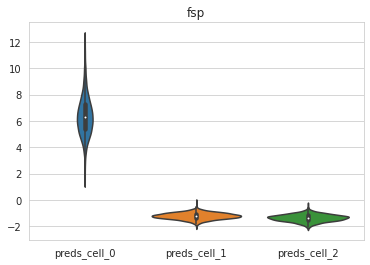

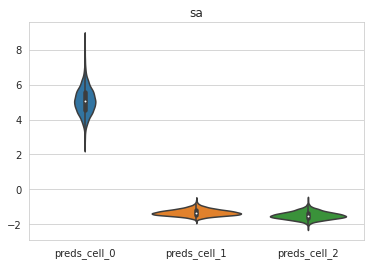

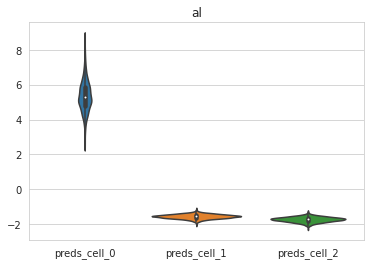

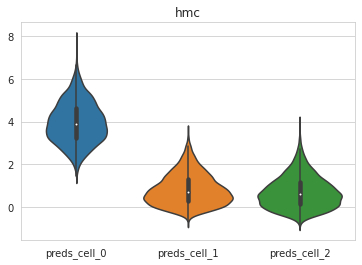

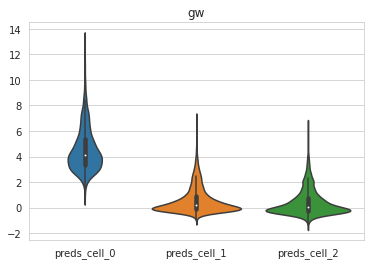

In [57]:
main_generators = ['fsp', 'sa', 'al', 'hmc', 'gw']

round_idx = 0
cell = 'k562'
for generator in main_generators:
    data_filter = (all_data['generator'] == generator) & (all_data['penalty_round'] == round_idx)
    plot_df = all_data[data_filter]
    temp_df = plot_df[plot_df['cell'] == cell][['preds_cell_0','preds_cell_1','preds_cell_2']]
    
    with sns.axes_style("whitegrid"):
        sns.violinplot(data=temp_df)
        plt.title(generator)
        plt.ylabel('log2FC')
        plt.show()

In [56]:
plot_df[plot_df.cell == cell][['preds_cell_0','preds_cell_1','preds_cell_2']]

,preds_cell_0,preds_cell_1,preds_cell_2
213653,5.893767,-1.135978,-1.363062
213654,6.425543,-1.234997,-1.291025
213655,5.232789,-1.155181,-1.494753
213656,4.992030,-1.418208,-1.506073
213657,5.877510,-1.124232,-1.027275
...,...,...,...
221398,6.113739,-1.212334,-0.999361
221399,6.598863,-1.156372,-1.259634
221400,6.428513,-0.604435,-0.810277
221401,7.969163,-0.832935,-1.001562


In [64]:
all_data = all_data[all_data['generator'].isin(main_generators)].reset_index(drop=True)

# Check predicted activities

In [84]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))

In [65]:
all_data['generator'].unique()

array(['hmc', 'sa', 'al', 'fsp', 'gw'], dtype=object)

In [66]:
def tidy_activities(data,x_tag):
    y_tags = ['preds_cell_0','preds_cell_1','preds_cell_2']
    new_df = pd.DataFrame(
        np.concatenate( [ data.loc[:,[x_tag, tag]].values for tag in y_tags ], axis=0 ), 
        columns=[x_tag, 'pred_value']
    )
    new_df['pred_id'] = np.arange(len(y_tags)).repeat(data.shape[0])
    return new_df.astype({x_tag:str,'pred_value':float,'pred_id': int})

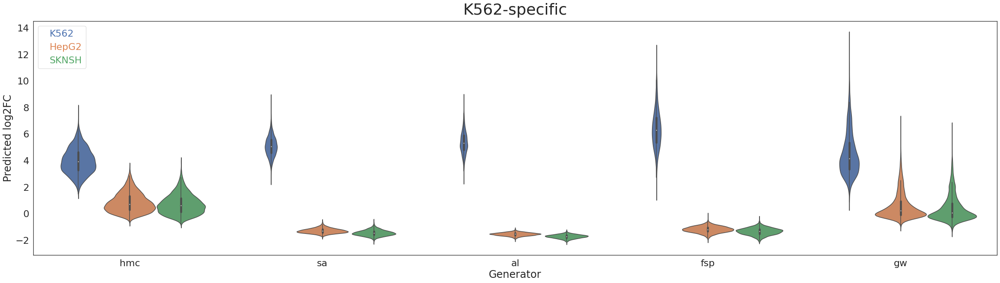

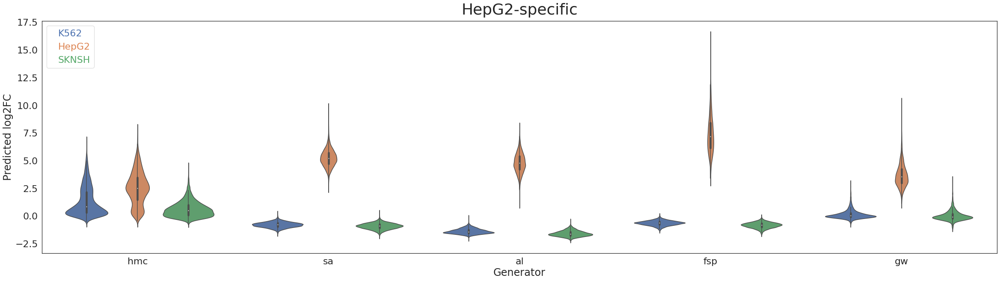

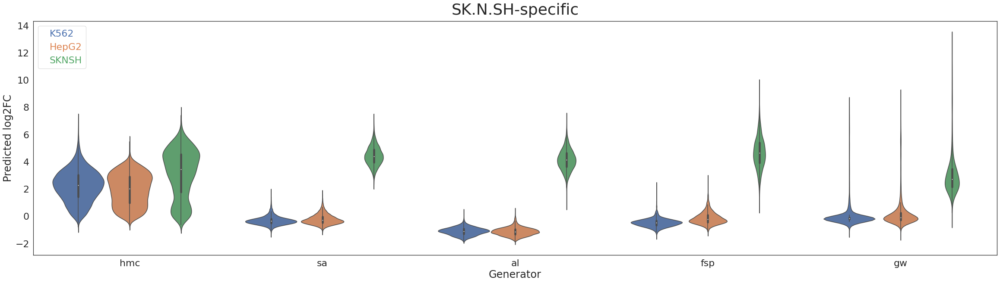

In [105]:
for pi in range(1):   
    with sns.axes_style("white"):
        pick_cell = 'k562'
        #sns.set(font_scale = 2)
        plt.figure(figsize=(40,10))
        #plt.title(f"Optimize K562, penalty {pi}")
        plt.title(f"K562-specific", fontsize=36, pad=15)
        g = sns.violinplot( 
            data=tidy_activities(
                all_data[ (all_data['penalty_round'] == pi) & (all_data['cell'] == pick_cell) ], 
                'generator'
            ),
            x='generator',
            y='pred_value',
            hue='pred_id'
        )
        plt.xlabel('Generator', fontsize=24)
        plt.ylabel('Predicted log2FC', fontsize=24)
        plt.legend(loc='upper left', labels=['K562', 'HepG2', 'SKNSH'], labelcolor=['C0', 'C1', 'C2'], handlelength=0.0)
        plt.savefig('figures/k562__round_0.png', transparent=True)
        plt.show()

        pick_cell = 'hepg2'

        plt.figure(figsize=(40,10))
        #plt.title(f"Optimize HepG2, penalty {pi}")
        plt.title(f"HepG2-specific", fontsize=36, pad=15)
        sns.violinplot( 
            data=tidy_activities(
                all_data[ (all_data['penalty_round'] == pi) & (all_data['cell'] == pick_cell) ], 
                'generator'
            ),
            x='generator',
            y='pred_value',
            hue='pred_id'
        )
        plt.xlabel('Generator', fontsize=24)
        plt.ylabel('Predicted log2FC', fontsize=24)
        plt.legend(loc='upper left', labels=['K562', 'HepG2', 'SKNSH'])
        plt.legend(loc='upper left', labels=['K562', 'HepG2', 'SKNSH'], labelcolor=['C0', 'C1', 'C2'], handlelength=0.0)
        plt.savefig('figures/hepg2__round_0.png', transparent=True)
        plt.show()

        pick_cell = 'sknsh'

        plt.figure(figsize=(40,10))
        #plt.title(f"Optimize SkNSh, penalty {pi}")
        plt.title(f"SK.N.SH-specific", fontsize=36, pad=15)
        sns.violinplot( 
            data=tidy_activities(
                all_data[ (all_data['penalty_round'] == pi) & (all_data['cell'] == pick_cell) ], 
                'generator'
            ),
            x='generator',
            y='pred_value',
            hue='pred_id'
        )
        plt.xlabel('Generator', fontsize=24)
        plt.ylabel('Predicted log2FC', fontsize=24)
        plt.legend(loc='upper left', labels=['K562', 'HepG2', 'SKNSH'])
        plt.legend(loc='upper left', labels=['K562', 'HepG2', 'SKNSH'], labelcolor=['C0', 'C1', 'C2'], handlelength=0.0)
        plt.savefig('figures/sknsh__round_0.png', transparent=True)
        plt.show()

# Check dups

In [ ]:
all_data.loc[all_data.duplicated('sequence', keep=False)]

In [ ]:
print( f"found {all_data.shape[0] - all_data['sequence'].unique().shape[0]}/{all_data.shape[0]} duplicated sequences" )

# Retrieve selection from previous dump

In [ ]:
old_dump = pd.read_pickle('gs://syrgoth/boda_library_design_202112/boda_design__round_1__20211214.pkl')

old_dump.loc[ (old_dump['user'] == 'sr') & (old_dump['generator'] == 'dhs') & (old_dump['cell'] == 'k562'), 'random_tag' ] = 999997
old_dump.loc[ (old_dump['user'] == 'sr') & (old_dump['generator'] == 'dhs') & (old_dump['cell'] == 'hepg2'), 'random_tag' ] = 999998
old_dump.loc[ (old_dump['user'] == 'sr') & (old_dump['generator'] == 'dhs') & (old_dump['cell'] == 'sknsh'), 'random_tag' ] = 999999

In [ ]:
all_data['selected'] = False
for idx, row in tqdm(old_dump.iterrows()):
    random_tag = row['random_tag']
    internal_index = row['internal_index']
    
    slicer = (all_data['random_tag'] == random_tag) & (all_data['internal_index'] == internal_index)
    
    assert all_data.loc[ slicer, 'selected' ].shape[0] == 1, f"failed on row {idx}"
    
    all_data.loc[ slicer, 'selected' ] = row['selected']

In [ ]:
print(f"assigned {sum( all_data['selected'])} based on old dump"  )

In [ ]:
dump_pandas_to_fasta(
    data=all_data, 
    fasta_path=f'gs://syrgoth/boda_library_design_202112/boda_design__round_1__20211214__modified.fa'
)

# Assign selection

In [ ]:
all_data['selected'] = False

In [ ]:
make_selections(
    data=all_data, 
    gen_list=['fsp','sa', 'sa_rep','al','hmc','gw','dhs'], 
    cell_list=['k562','hepg2','sknsh'],
    pen_list=[0],
    n_items=4000
)

make_selections(
    data=all_data, 
    gen_list=['fsp','sa','al'], 
    cell_list=['k562','hepg2','sknsh'],
    pen_list=[1,2,3,4,5],
    n_items=1000
)

make_selections(
    data=all_data, 
    gen_list=['fsp_uc','sa_uc','al_uc'], 
    cell_list=['k562','hepg2','sknsh'],
    pen_list=[0],
    n_items=100
)

In [ ]:
dump_pandas_to_fasta(
    data=all_data, 
    fasta_path=f'gs://syrgoth/boda_library_design_202112/test_design__{time.strftime("%Y%m%d")}.fa'
)

In [ ]:
dump_pandas_to_fasta(
    data=all_data, 
    fasta_path=f'gs://syrgoth/boda_library_design_202112/boda_design__round_1__{time.strftime("%Y%m%d")}.fa'
)

# Check final fasta activities

In [ ]:
sel_filtered = all_data.loc[ all_data['selected'] == True ]

for pi in range(6):

    pick_cell = 'k562'

    plt.figure(figsize=(14,7))
    plt.title(f"Optimize K562, penalty {pi}")
    sns.violinplot( 
        data=tidy_activities(
            sel_filtered[ (sel_filtered['penalty_round'] == pi) & (sel_filtered['cell'] == pick_cell) ], 
            'generator'
        ),
        x='generator',
        y='pred_value',
        hue='pred_id'
    )
    plt.show()

    pick_cell = 'hepg2'

    plt.figure(figsize=(14,7))
    plt.title(f"Optimize HepG2, penalty {pi}")
    sns.violinplot( 
        data=tidy_activities(
            sel_filtered[ (sel_filtered['penalty_round'] == pi) & (sel_filtered['cell'] == pick_cell) ], 
            'generator'
        ),
        x='generator',
        y='pred_value',
        hue='pred_id'
    )
    plt.show()

    pick_cell = 'sknsh'

    plt.figure(figsize=(14,7))
    plt.title(f"Optimize SkNSh, penalty {pi}")
    sns.violinplot( 
        data=tidy_activities(
            sel_filtered[ (sel_filtered['penalty_round'] == pi) & (sel_filtered['cell'] == pick_cell) ], 
            'generator'
        ),
        x='generator',
        y='pred_value',
        hue='pred_id'
    )
    plt.show()


# K-mer content

In [28]:
def jaccard_index(x, y, max_batch_size=1024, dtype=torch.float, device='cpu'):
    assert len(x.shape) == 2, f"expected x as 2D tensor, instead got shape {x.shape}"
    assert len(y.shape) == 2, f"expected y as 2D tensor, instead got shape {y.shape}"
    matrix = []
    x_loader = torch.utils.data.DataLoader( x, batch_size=max_batch_size )
    y_loader = torch.utils.data.DataLoader( y, batch_size=max_batch_size )
    for x_batch in x_loader:
        row = []
        x_batch = x_batch.unsqueeze(1)
        for y_batch in y_loader:
            y_batch = y_batch.unsqueeze(0)
            inter = torch.logical_and(x_batch,y_batch).sum(-1)
            union = torch.logical_or(x_batch,y_batch).sum(-1)
            ji = inter / union
            row.append(ji.type(dtype).to(device))
        matrix.append( torch.cat(row,dim=-1) )
    return torch.cat(matrix,dim=0)

def euclidean_distance(x, y, max_batch_size=1024, dtype=torch.float, device='cpu'):
    assert len(x.shape) == 2, f"expected x as 2D tensor, instead got shape {x.shape}"
    assert len(y.shape) == 2, f"expected y as 2D tensor, instead got shape {y.shape}"
    matrix = []
    x_loader = torch.utils.data.DataLoader( x, batch_size=max_batch_size )
    y_loader = torch.utils.data.DataLoader( y, batch_size=max_batch_size )
    for x_batch in x_loader:
        row = []
        x_batch = x_batch.unsqueeze(1)
        for y_batch in y_loader:
            y_batch = y_batch.unsqueeze(0)
            dist  = (x_batch - y_batch).pow(2).sum(-1).pow(0.5)
            row.append(dist.type(dtype).to(device))
        matrix.append( torch.cat(row,dim=-1) )
    return torch.cat(matrix,dim=0)

In [29]:
def agglomeration_fraction_plot(linkage, midpoint=0.6):
    sep_factor = 0.01
    span_a = np.linspace(-0.001,midpoint-sep_factor,5)
    span_b = np.linspace(midpoint,1.001,50)
    span = np.concatenate([span_a,span_b])
    agglo_a = np.array([ hierarchy.cut_tree(linkage, height=thresh).max() for thresh in span_a ])
    agglo_b = np.array([ hierarchy.cut_tree(linkage, height=thresh).max() for thresh in span_b ])
    agglo= np.concatenate([agglo_a,agglo_b])
    ag_frac = agglo/linkage.shape[0]
    auc  = ((agglo_a/linkage.shape[0]).mean()*(midpoint-sep_factor)) + ((agglo_b/linkage.shape[0]).mean()*(1-midpoint))
    ax = sns.lineplot(
        x=span, 
        y=ag_frac
    )
    return ax, auc

# K562 ID clustering

In [30]:
pick_cell = 'k562'

## DHS

In [31]:
slicer = (all_data['generator'] == 'dhs') & (all_data['cell'] == pick_cell)

print(f'grabbing {slicer.sum()} sequences')

grabbing 4000 sequences


In [32]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 4000/4000 [00:00<00:00, 12726.86it/s]


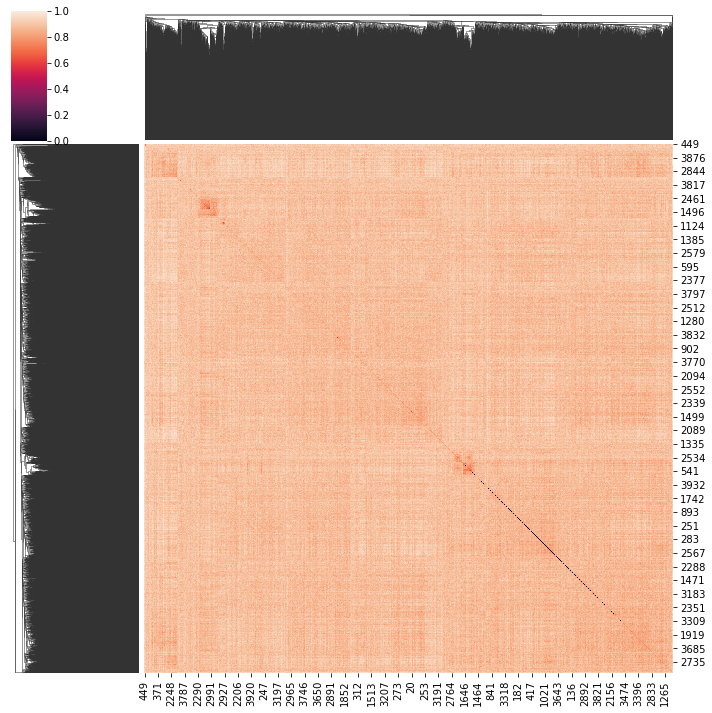

In [33]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.7922140535133784


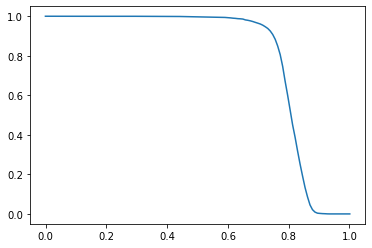

In [34]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

## SA

### Round 0

In [35]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 0)

print(f'grabbing {slicer.sum()} sequences')

grabbing 10000 sequences


In [36]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 10000/10000 [00:00<00:00, 13198.37it/s]


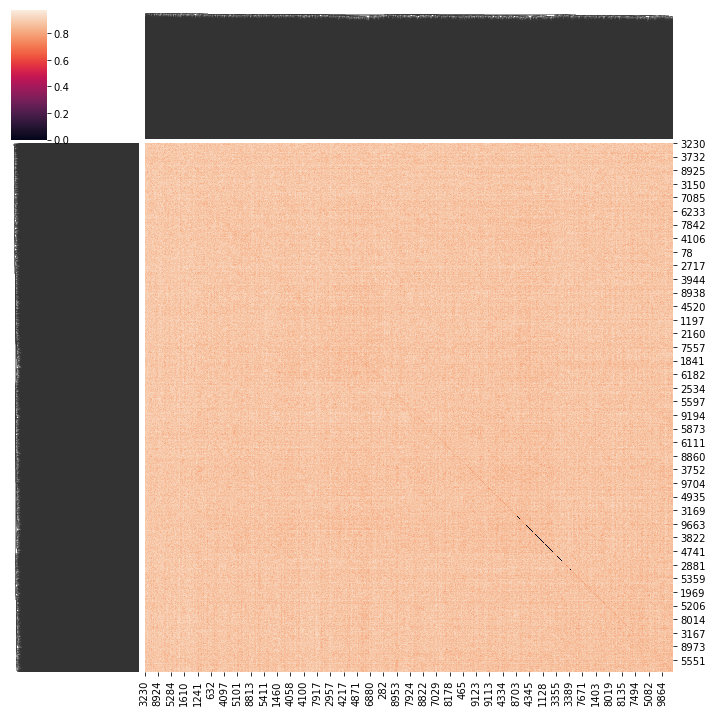

In [37]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8014987498749875


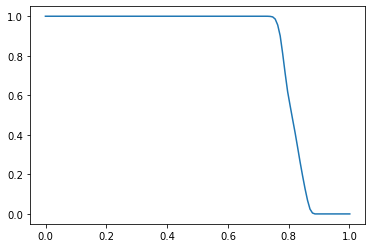

In [38]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 1

In [39]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 1)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [40]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 13395.02it/s]


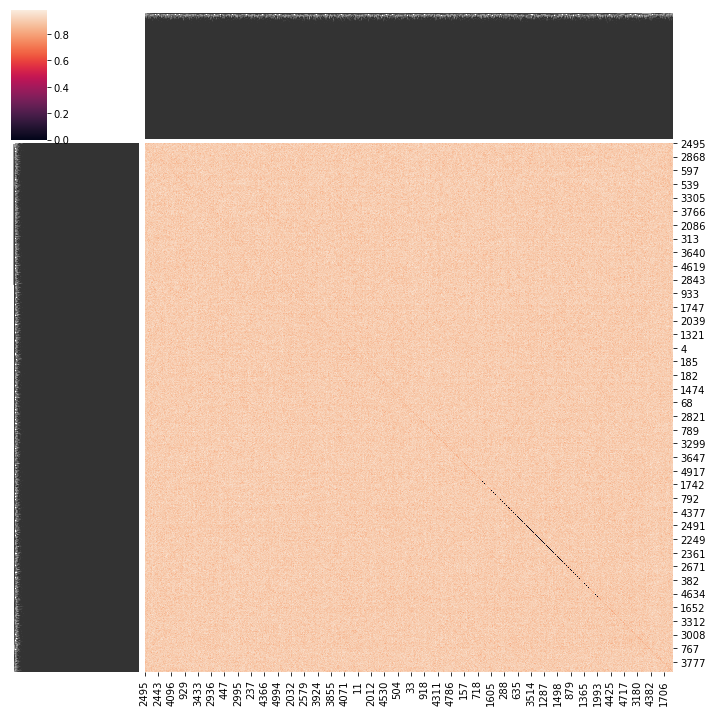

In [41]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8339495899179836


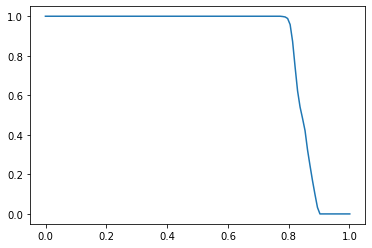

In [42]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 2

In [43]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 2)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [44]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 12840.73it/s]


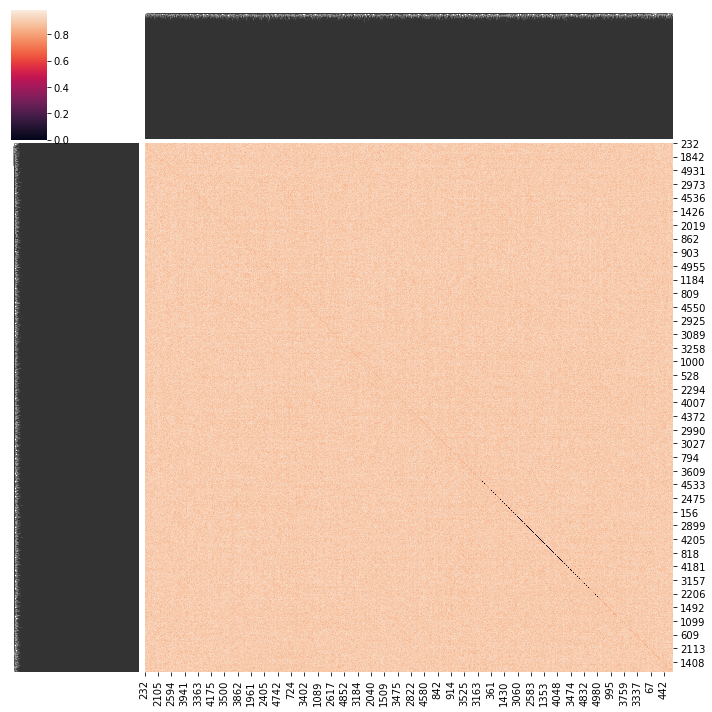

In [45]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8342184436887378


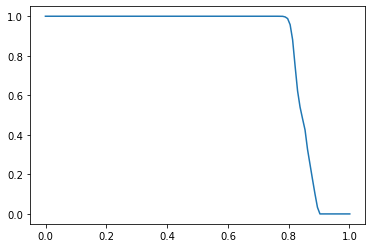

In [46]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

## FSP

### Round 0

In [47]:
slicer = (all_data['generator'] == 'fsp') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 0)

print(f'grabbing {slicer.sum()} sequences')

grabbing 4000 sequences


In [48]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 4000/4000 [00:00<00:00, 13206.90it/s]


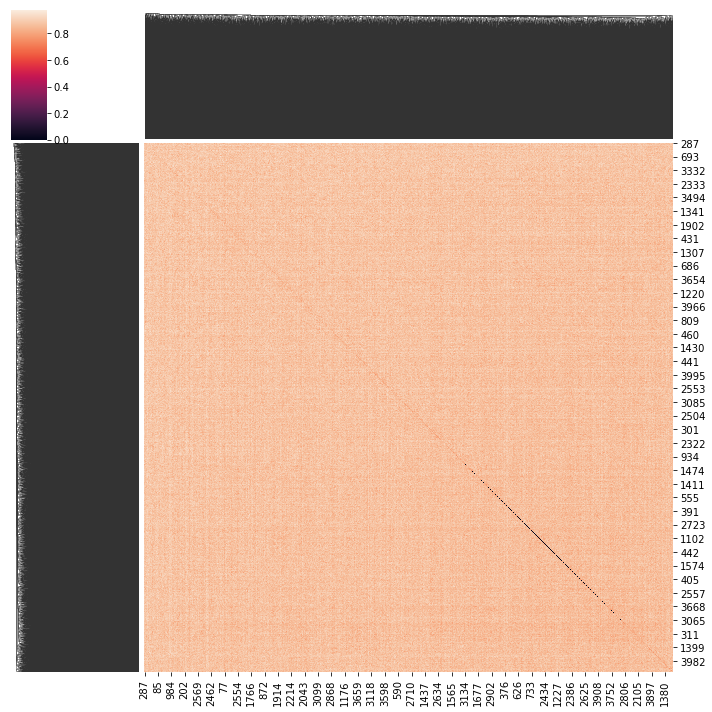

In [49]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8022070517629407


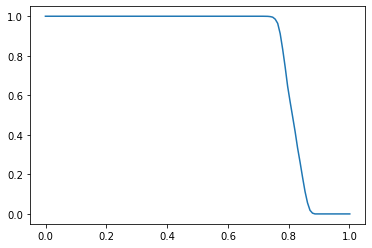

In [50]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 1

In [51]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 1)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [52]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 13294.69it/s]


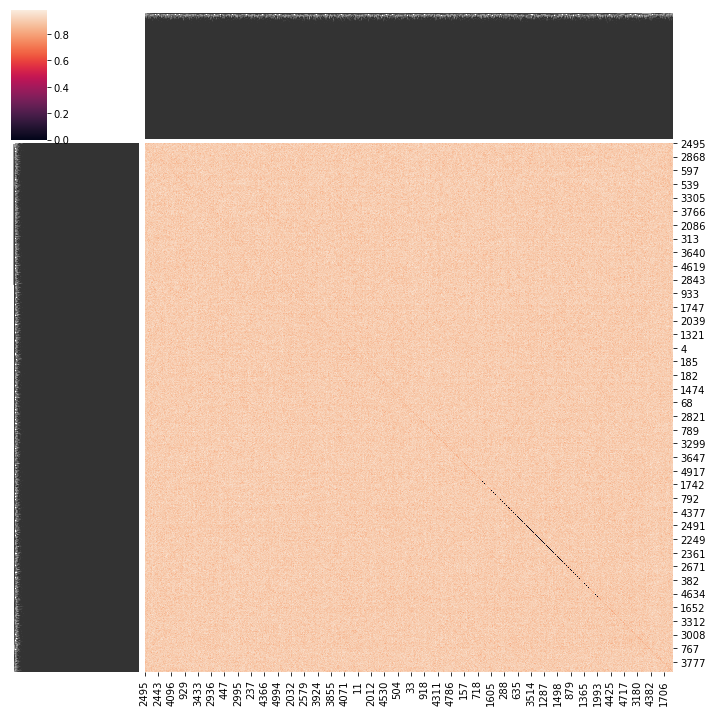

In [53]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8339495899179836


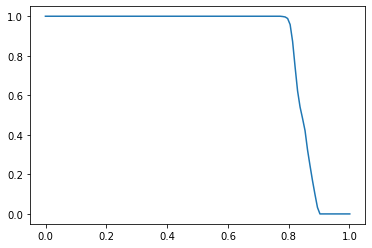

In [54]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 2

In [55]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 2)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [56]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 13944.39it/s]


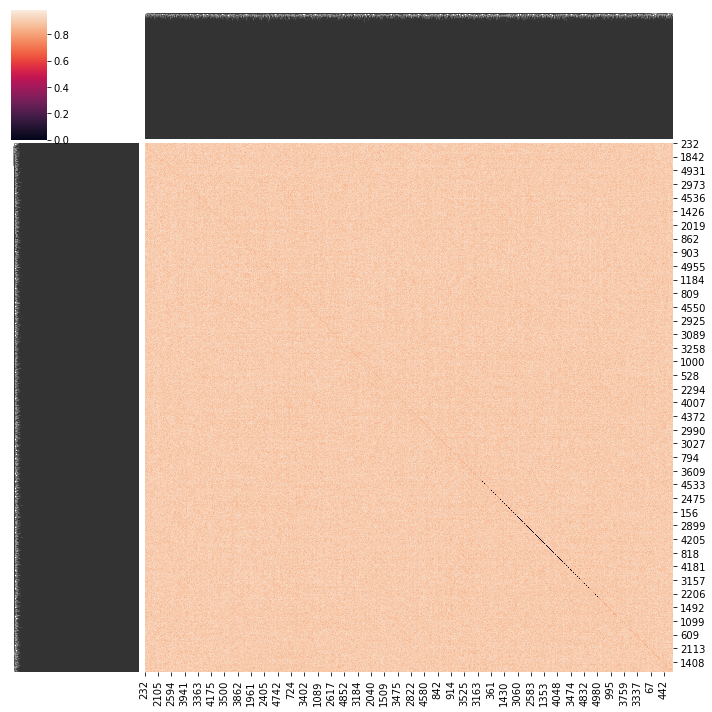

In [57]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8342184436887378


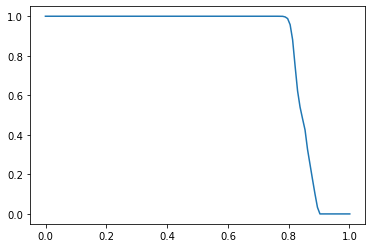

In [58]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

# HepG2 ID clustering

In [59]:
pick_cell = 'hepg2'

## DHS

In [60]:
slicer = (all_data['generator'] == 'dhs') & (all_data['cell'] == pick_cell)

print(f'grabbing {slicer.sum()} sequences')

grabbing 4000 sequences


In [61]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 4000/4000 [00:00<00:00, 11921.22it/s]


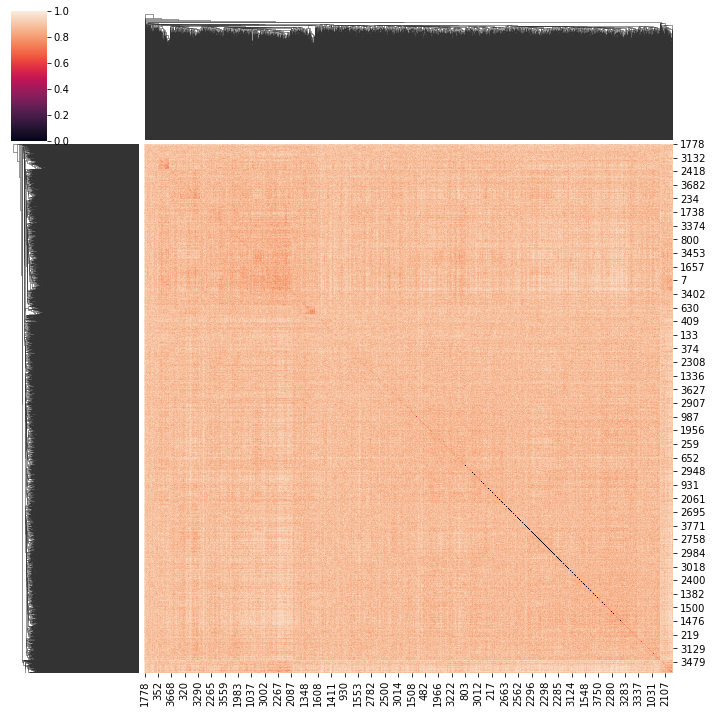

In [62]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.7973118279569892


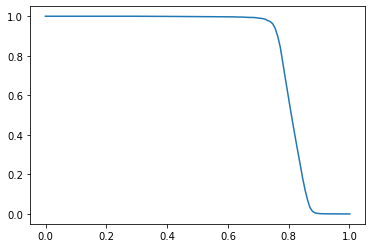

In [63]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

## SA

### Round 0

In [64]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 0)

print(f'grabbing {slicer.sum()} sequences')

grabbing 10000 sequences


In [65]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 10000/10000 [00:00<00:00, 13629.33it/s]


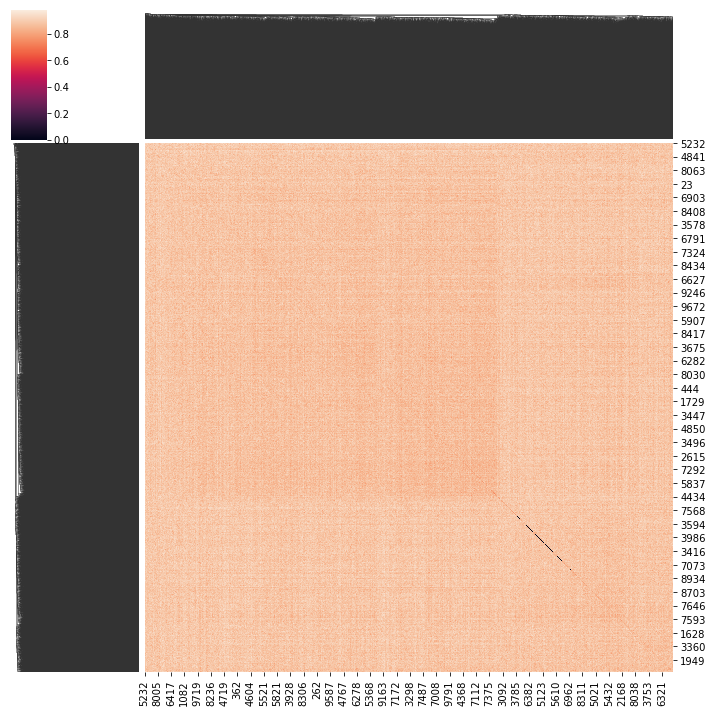

In [66]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8027412741274127


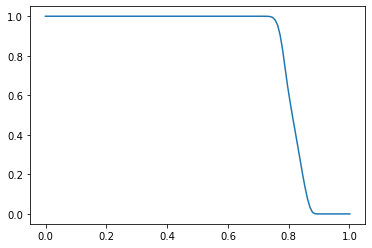

In [67]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 1

In [68]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 1)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [69]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 13176.38it/s]


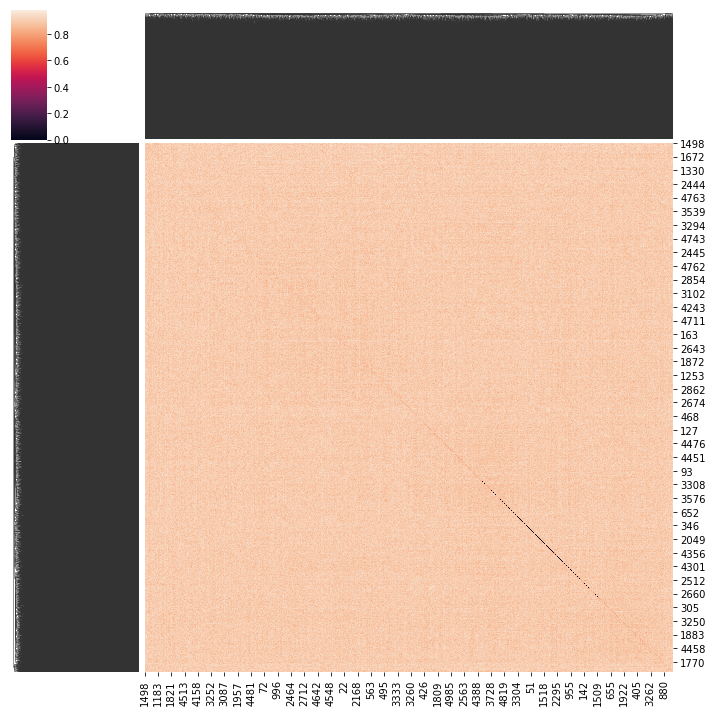

In [70]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8289821964392878


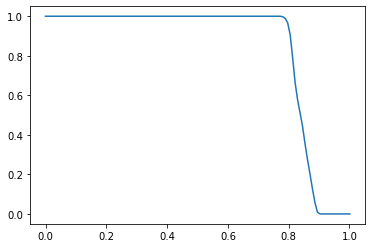

In [71]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 2

In [72]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 2)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [73]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 13798.31it/s]


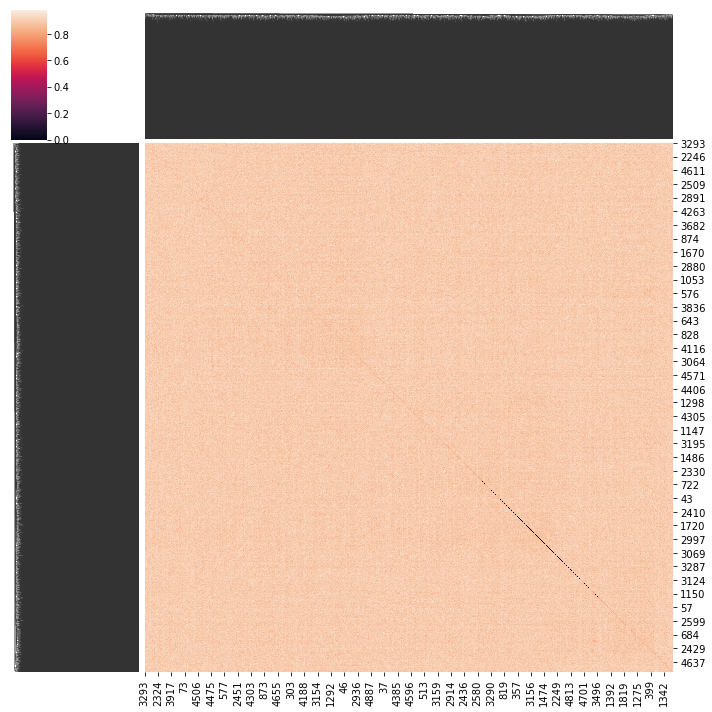

In [74]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8293102620524104


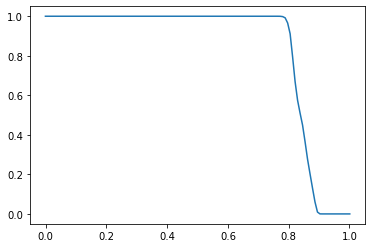

In [75]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

## FSP

### Round 0

In [76]:
slicer = (all_data['generator'] == 'fsp') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 0)

print(f'grabbing {slicer.sum()} sequences')

grabbing 4000 sequences


In [77]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 4000/4000 [00:00<00:00, 13173.61it/s]


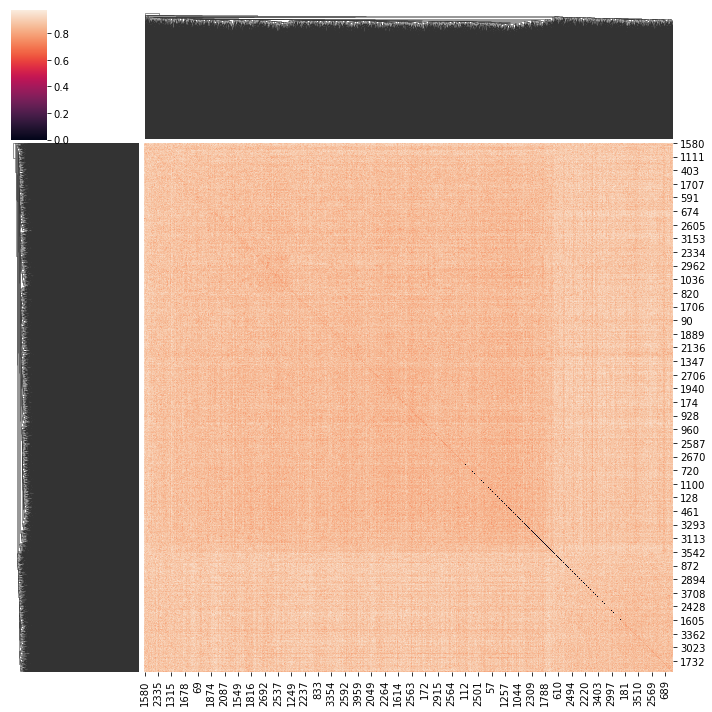

In [78]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.7935048762190547


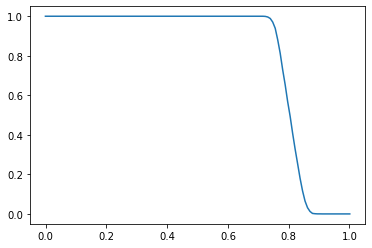

In [79]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 1

In [80]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 1)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [81]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 12783.40it/s]


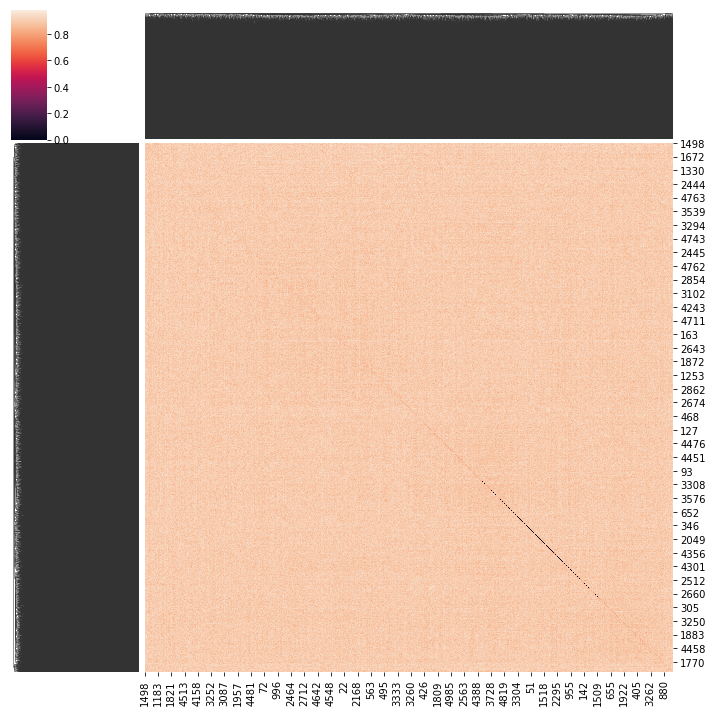

In [82]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8289821964392878


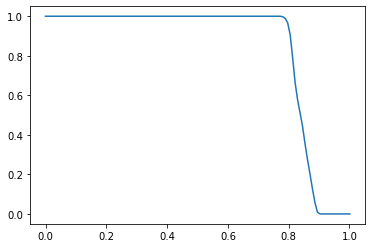

In [83]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 2

In [84]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 2)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [85]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 13235.91it/s]


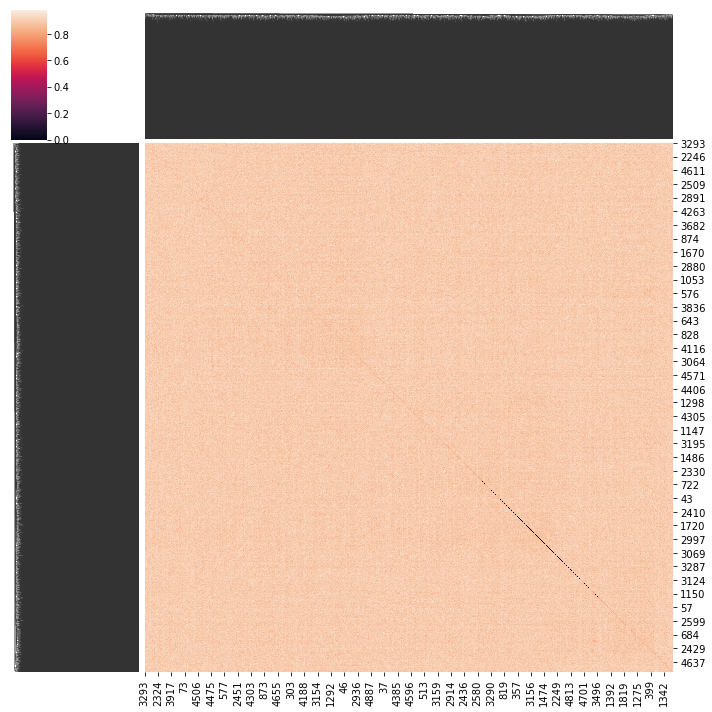

In [86]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8293102620524104


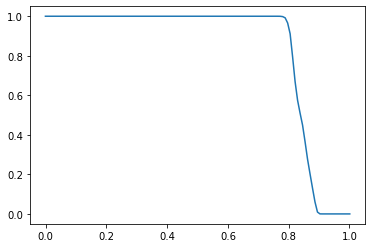

In [87]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

# SkNSh ID clustering

In [88]:
pick_cell = 'sknsh'

## DHS

In [89]:
slicer = (all_data['generator'] == 'dhs') & (all_data['cell'] == pick_cell)

print(f'grabbing {slicer.sum()} sequences')

grabbing 4000 sequences


In [90]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 4000/4000 [00:00<00:00, 14024.54it/s]


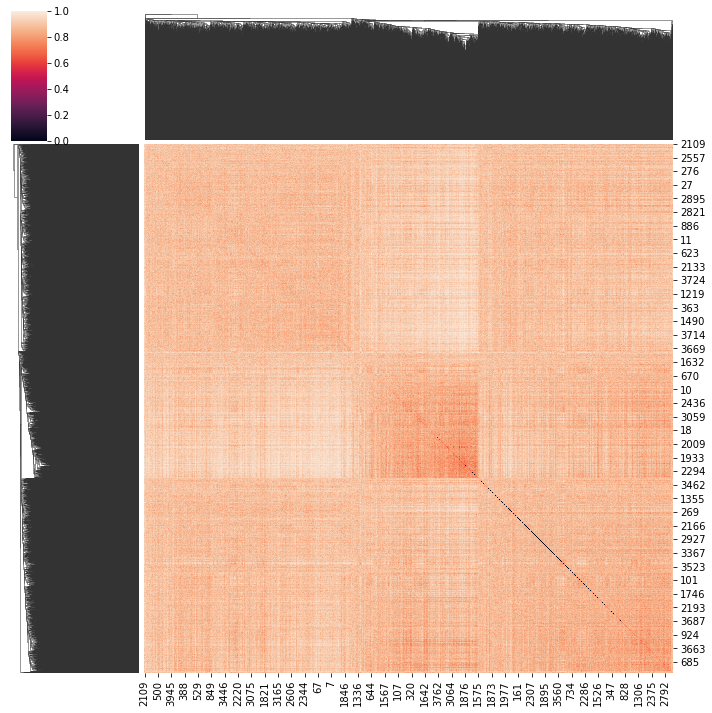

In [91]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.7875888972243061


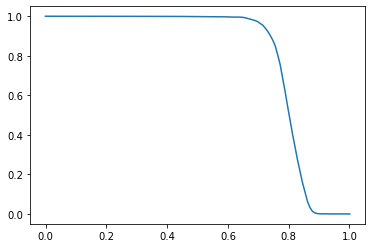

In [92]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

## SA

### Round 0

In [93]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 0)

print(f'grabbing {slicer.sum()} sequences')

grabbing 10000 sequences


In [94]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 10000/10000 [00:00<00:00, 13012.25it/s]


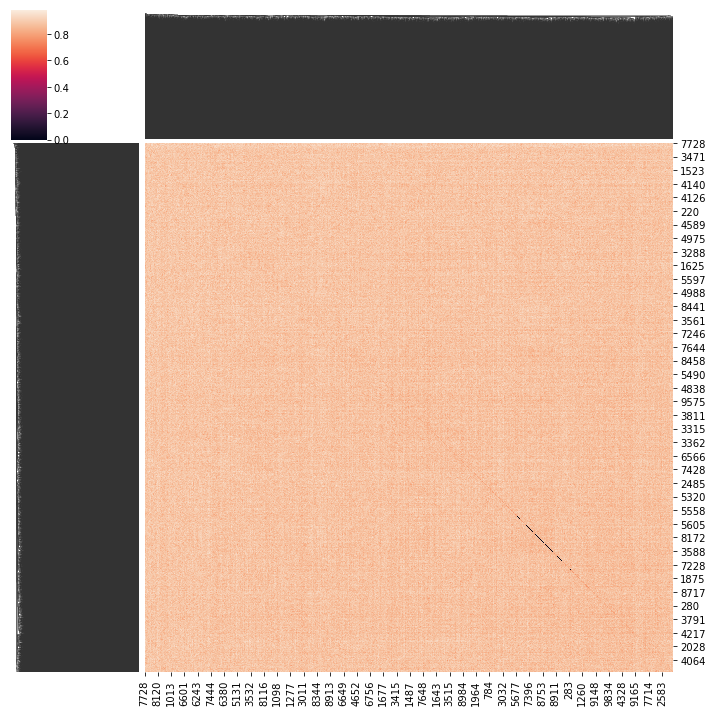

In [95]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8032805280528053


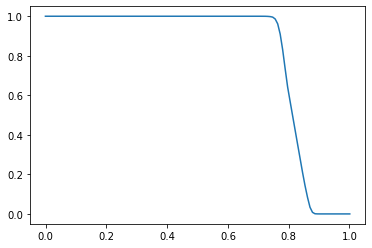

In [96]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 1

In [97]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 1)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [98]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 13226.42it/s]


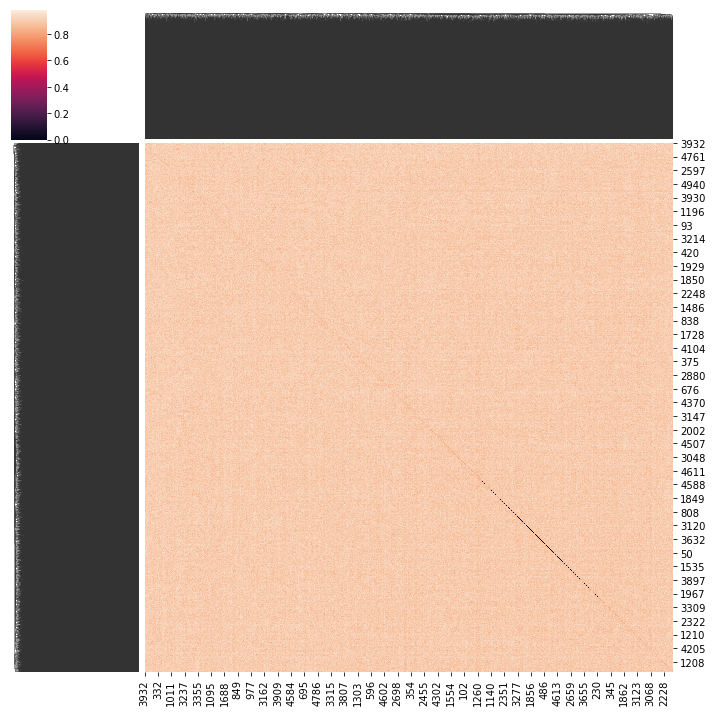

In [99]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8305201040208041


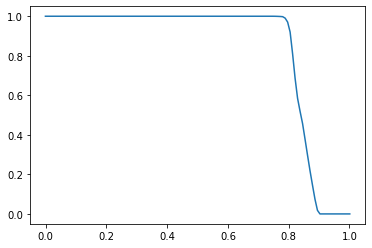

In [100]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 2

In [101]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 2)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [102]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 12667.59it/s]


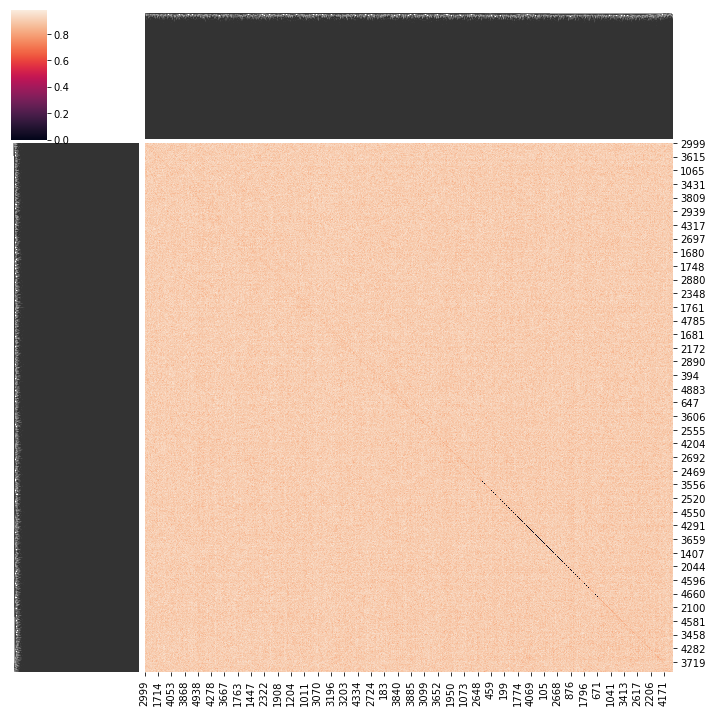

In [103]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8326421284256851


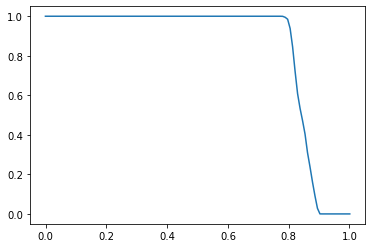

In [104]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

## FSP

### Round 0

In [105]:
slicer = (all_data['generator'] == 'fsp') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 0)

print(f'grabbing {slicer.sum()} sequences')

grabbing 4000 sequences


In [106]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 4000/4000 [00:00<00:00, 14241.91it/s]


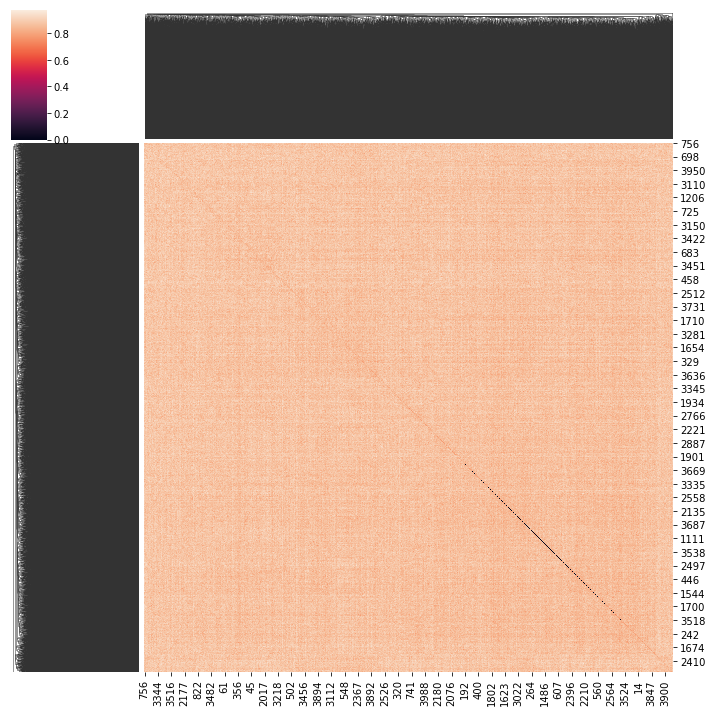

In [107]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.801324831207802


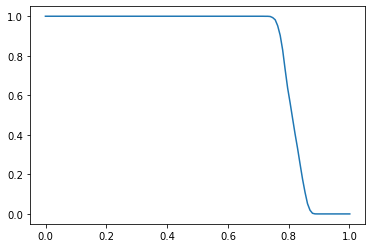

In [108]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 1

In [109]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 1)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [110]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 12871.14it/s]


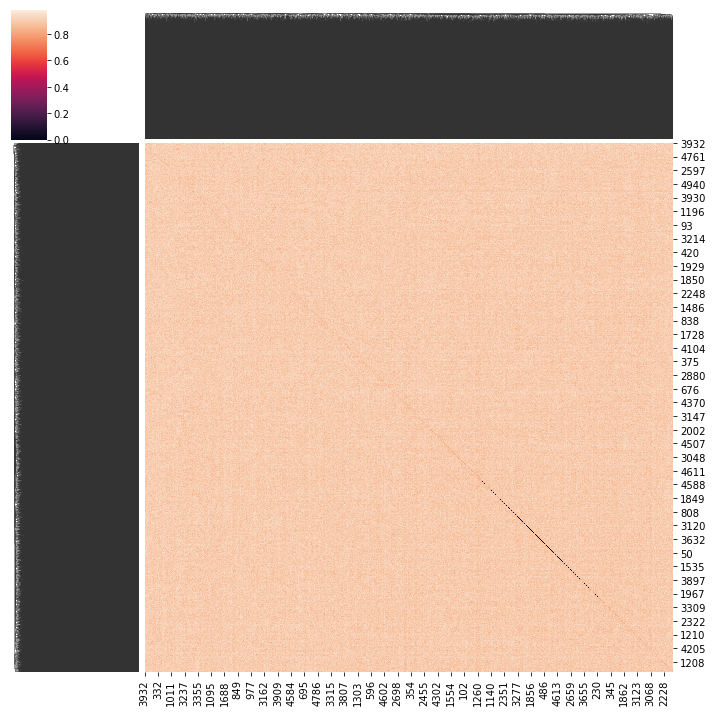

In [111]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8305201040208041


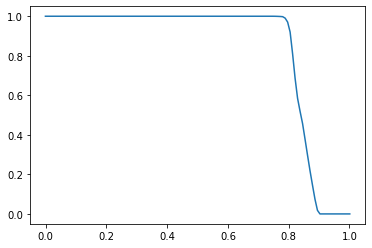

In [112]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()

### Round 2

In [113]:
slicer = (all_data['generator'] == 'sa') & (all_data['cell'] == pick_cell) & (all_data['penalty_round'] == 2)

print(f'grabbing {slicer.sum()} sequences')

grabbing 5000 sequences


In [114]:
pentamer_scan = boda.common.utils.KmerFilter(k=5)
kmer_content  = pentamer_scan( l2t( all_data.loc[ slicer, 'sequence' ] ) ).max(dim=-1).values

100%|██████████| 5000/5000 [00:00<00:00, 12899.30it/s]


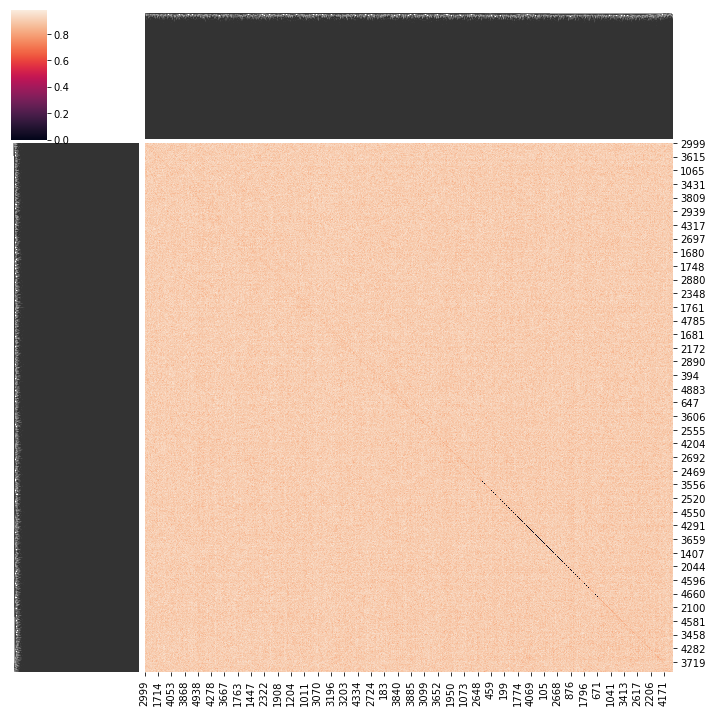

In [115]:
jac_res = jaccard_index(kmer_content, kmer_content, max_batch_size=512, dtype=torch.half)

DF_dism = 1 - jac_res.cpu().numpy()   # distance matrix
linkage = hierarchy.linkage(spatial.distance.squareform(DF_dism), method='average')
sns.clustermap(DF_dism, row_linkage=linkage, col_linkage=linkage)

Mean dendrogram cutting AUC: 0.8326421284256851


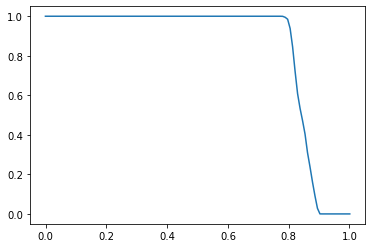

In [116]:
ax, auc = agglomeration_fraction_plot(linkage)
print(f'Mean dendrogram cutting AUC: {auc}')
plt.show()